This document briefly presents the logic and key steps for annotating cell labels, but not all steps. It should be noted that the results predicted by the algorithm are only used for auxiliary annotation, and the final annotation results are still manual.

The annotation steps as follow:<br>
Step1: Firstly, we collect public organotypic endothelial cell datasets in adult mice. <br>
Step2: The adult endothelial cell datasets were used to train the Random Forest Classifier to predict the E19.0 ECs in different organs, the organ-specific endothelial DEGs were used as input. <br>
Step3: The initially-predicted E19.0 endothelial population was further analyzed combining unsupervised clustering, organ-specific molecular markers and anatomical tag during sequencing (brain, viscera, skin and skeleton) to refine the cell labelling of E19.0 ECs in each organ. The final E19.0 endothelial cell organ annotation was used for further prediction. <br>
Step4: Based on developmental time tag during sequencing (E7.0-E8.0), we defined the population of unorganotypic differentiated ECs. <br>
Step5: The ECs in each organ of E19.0 was combined with E7.0-E8.0 early-stage ECs (from step 4) to train the Random Forest Classifier to predict the remaining endothelial cells. <br>
Step6: Refine and confirm the cell labelling. 

In [1]:
import sys,warnings
sys.path.append('./DevEndo/') # change to the path where devendo.py stript located.
import devendo as de
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import anndata, re,os
from scipy.sparse import csr_matrix,csc_matrix, find
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
sc.settings.set_figure_params(dpi=100, facecolor='white')
pd.set_option("display.max_rows", 40)
pd.set_option("display.precision", 2)

## 1. Load adult EC datasets

The adult dataset refet to [ Single-Cell Transcriptome Atlas of Murine Endothelial Cells ](https://doi.org/10.1016/j.cell.2020.01.015).

In [2]:
adata = sc.read_h5ad('DATA/sted-ec.h5ad')

In [3]:
pdata = sc.read('DATA/public_datasets/Kalucka2020.h5ad')

In [4]:
pdata_marker = {'Brain':['Foxq1','Pglyrp1'],
                'Lung':['Scn7a','Tmem100'],
                'Lymph':['Prox1','Reln'],
                'Heart':['Hand2','Tmem108'],
                'Liver':['Dnase1l3','Oit3'],
                'Intestine':['Madcam1','Nkx2-3'],
                'Kidney':['Irx3','Ptpru'],
                'Muscle':['C1qtnf9','Timp4'],
                'Spleen':['Star'],'Testis':['Lcn2']
}

In [5]:
pdata.obs['organ'] = pd.Categorical(np.array(pdata.obs['organ']), list(pdata_marker.keys()))

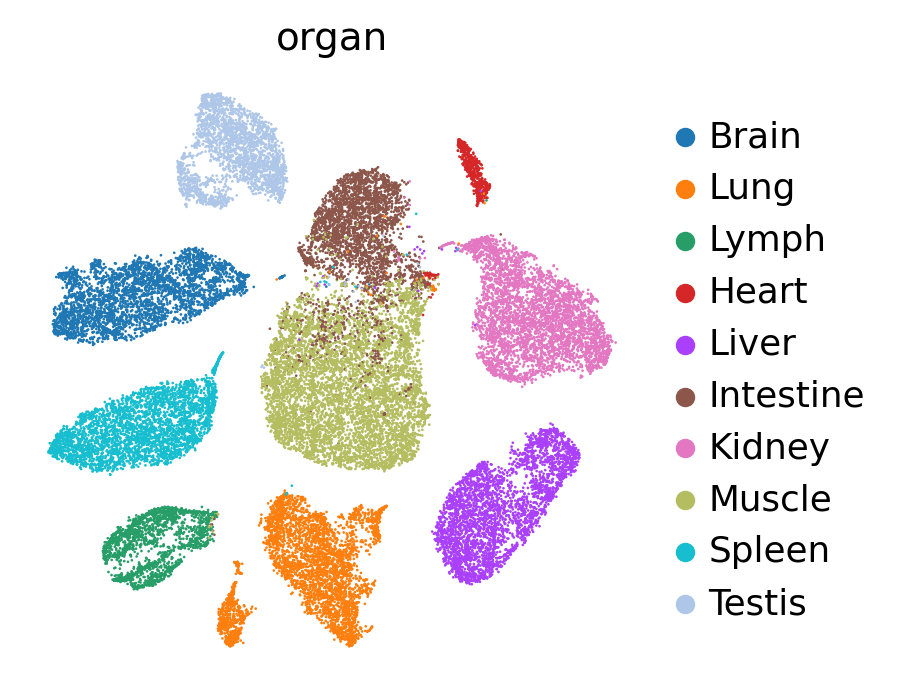

In [6]:
sc.pl.tsne(pdata, color = 'organ',cmap = de.mymap, frameon=False)

In [7]:
deg_adult = de.FindAllMarkers(pdata, 'organ')

Calculate DEGs...


In [8]:
top_deg = deg_adult.sort_values(by='logfoldchanges',ascending=False).groupby('group').head(8)
marker_dict = de.split(top_deg['names'],top_deg['group'])
marker_dict = {i:marker_dict[i] for i in pdata.obs['organ'].cat.categories}

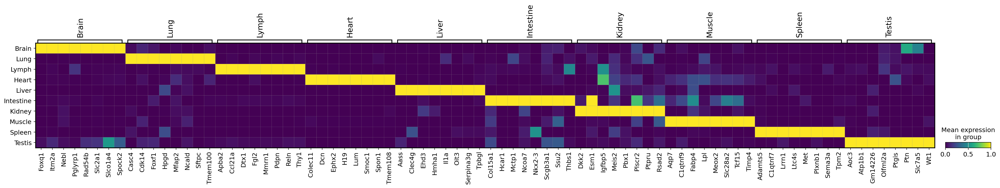

In [9]:
sc.pl.matrixplot(pdata, marker_dict, standard_scale='var',groupby="organ",swap_axes=False,  cmap="viridis")

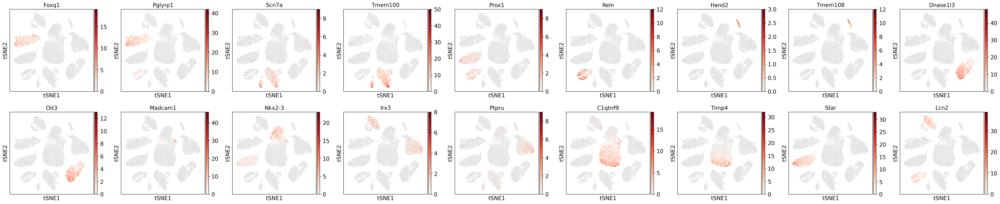

In [10]:
sc.pl.tsne(pdata, color = np.concatenate([pdata_marker[i] for i in pdata_marker]),cmap = de.mymap, ncols = 9)

## 2. Predict the E19.0 cell labels

In embryonic data, the E19.0 cells are most colse to adult data, so I annotate the E19.0 cells first. Random forest algorithm from sklearn is used to predict cell labels.

In [11]:
e19 = adata[adata.obs['embryonic_period'] == 'E19.0']

In [12]:
sc.pp.highly_variable_genes(e19, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pp.highly_variable_genes(pdata, min_mean=0.0125, max_mean=3, min_disp=0.5)
used_genes = np.intersect1d(pdata.var_names.values[pdata.var['highly_variable'].values], e19.var_names.values[e19.var['highly_variable'].values])

/share/home/lhlin/.conda/envs/scib/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:744: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


In [13]:
label = de.predict_cell_labels(pdata, e19,training_label='organ', 
                                      features=used_genes, predict_label='predict_label',
                                      cells_per_group = 1000,return_model = False) 

Results are save in .obs['predict_label'] and predict_adata.uns['predict_proba']


In [14]:
e19 = de.oneStepUmap(e19)

/share/home/lhlin/.conda/envs/scib/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:309: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/share/home/lhlin/.conda/envs/scib/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/share/home/lhlin/.conda/envs/scib/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


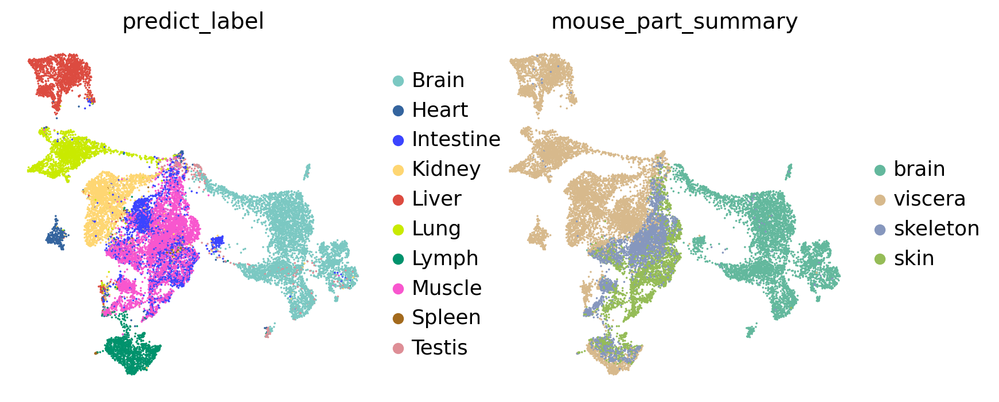

In [15]:
sc.pl.umap(e19, color = ['predict_label','mouse_part_summary'],cmap = 'Spectral',frameon=False) 

### 3. Redefined E19.0 cell labels

We redefined the cell labels based on the sampling part, clustering results, and marker gene expression, the updated labels were stored in adata.obs['organ'].

In [16]:
new_marker_dict = {
    'UOD ECs':['Cdh5'],
    'CNS ECs':['Foxq1'],
    'Pulmonary ECs':['Scn7a'],
    'Lymphatic ECs':['Prox1'],
    'Endocardial ECs':['Hand2'],
    'Hepatic ECs':['Dnase1l3'],
    'Gastrointestina ECs':['Nkx2-3'],
    'Renal ECs':['Ptpru'],
    'Muscular&dermal ECs':['C1qtnf9'],
    'UODArterial ECs':['Gja5'],
    'EndoMT':['Pdgfrb']
}

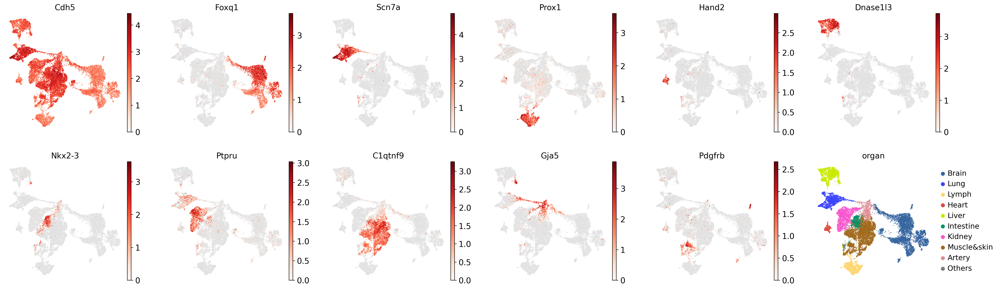

In [17]:
sc.pl.umap(e19,use_raw=False, color = list(np.concatenate([new_marker_dict[i] for i in new_marker_dict]))+['organ'],cmap = de.mymap,frameon=False,ncols=6) 

## 4. Annotate the cells of early stages

These labels are predefined: undifferentiated endothelial cells highly express Bex1 and Lin28, whereas endocardial cells highly express Hand2 and Gata5.

In [18]:
early = adata[adata.obs['embryonic_period'].isin(['E7.0','E7.5','E7.75','E8.0'])]

In [19]:
early = de.oneStepUmap(early)

/share/home/lhlin/.conda/envs/scib/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:744: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/share/home/lhlin/.conda/envs/scib/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:309: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/share/home/lhlin/.conda/envs/scib/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


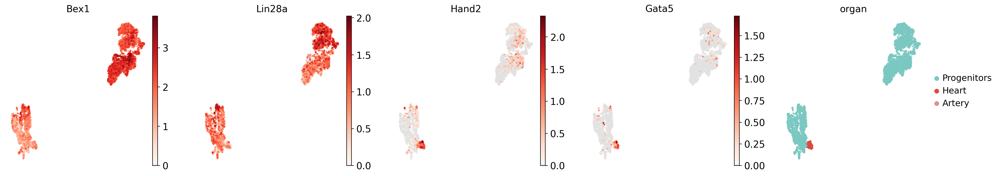

In [20]:
sc.pl.umap(early,use_raw =False, color = ['Bex1','Lin28a','Hand2','Gata5','organ'],cmap = de.mymap,frameon=False,ncols = 6) 

## 5. Predict labels of the rest cells

Now we concatenate cells from the early and late stages, train a new random forest classifier, and predict the labels of the remaining cells.

In [21]:
adata_train = anndata.concat([early, e19])

Use the DEGs for prediction

In [22]:
deg = de.FindAllMarkers(adata_train, 'organ')
used_genes = np.unique(deg['names'])

Calculate DEGs...


In [23]:
de.predict_cell_labels(adata_train, adata, features=used_genes, training_label='organ', predict_label='predict_label') 

Results are save in .obs['predict_label'] and predict_adata.uns['predict_proba']


array(['Progenitors', 'Progenitors', 'Progenitors', ..., 'Muscle&skin',
       'Muscle&skin', 'Lymph'], dtype=object)

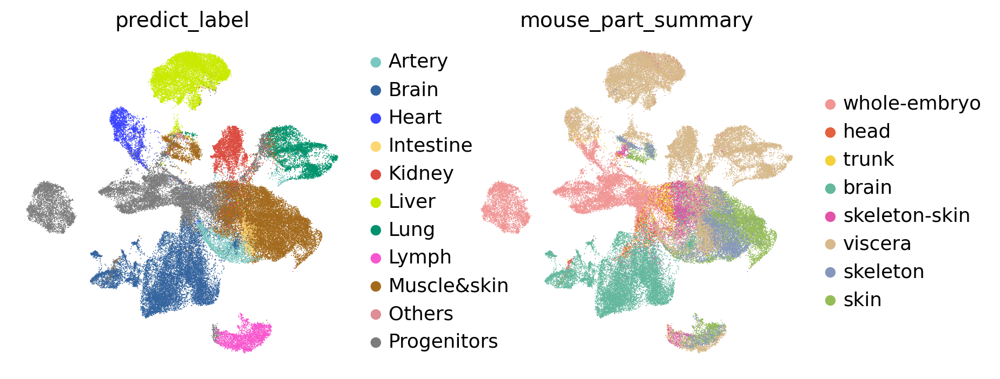

In [24]:
sc.pl.umap(adata, color = ['predict_label','mouse_part_summary'],ncols = 6,cmap  = de.mymap,frameon=False)

### 6. Redefined the cell labels

We redefined the cell labels based on the sampling part, clustering results, and marker gene expression, the updated labels were stored in adata.obs['organ'].

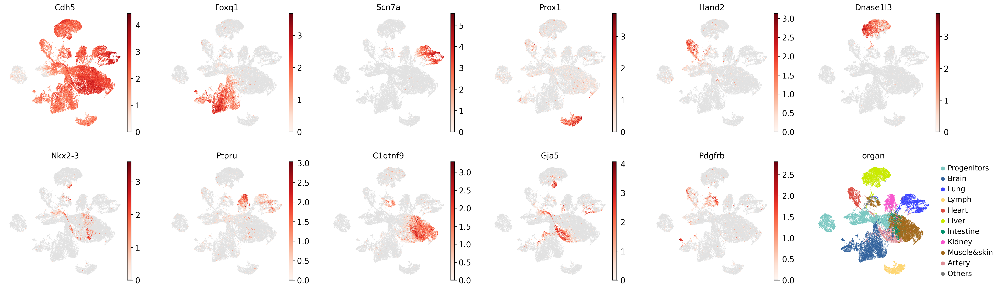

In [25]:
sc.pl.umap(adata,use_raw=False, color = list(np.concatenate([new_marker_dict[i] for i in new_marker_dict]))+['organ'],cmap = de.mymap,frameon=False,ncols=6) 